## Load libraries and files

In [115]:
library(dplyr)
library(Seurat)
library(patchwork)
library(stringr)
library(ggplot2)
library(EnhancedVolcano)
library(msigdbr)
library(fgsea)
library(gridExtra)
library(readxl)
library(grid)
library(plotly)
library(shiny)
library(tibble)
library(pheatmap)
library(RColorBrewer)
library(tidyr)
library(fedmatch)

In [116]:
dir1 = readline(prompt = "Please enter file directory to load LOG_NORM_NOVOALL_filt_integ_final: ") # add .rds extension
LOG_NORM_NOVOALL_filt_integ_final = readRDS(dir1)

Please enter file directory to load LOG_NORM_NOVOALL_filt_integ_final:  ../data_files2/LOG_NORM_NOVOALL_filt_integ_final.rds


In [117]:
dir_gslist = readline(prompt = "Please enter file directory to load gs_list.rds: ")
gs_list = readRDS(dir_gslist)

Please enter file directory to load gs_list.rds:  ../raw_data/gs_list.rds


## Cell proportions by classification in each cluster

`summarise()` has grouped output by 'genotype'. You can override using the
`.groups` argument.


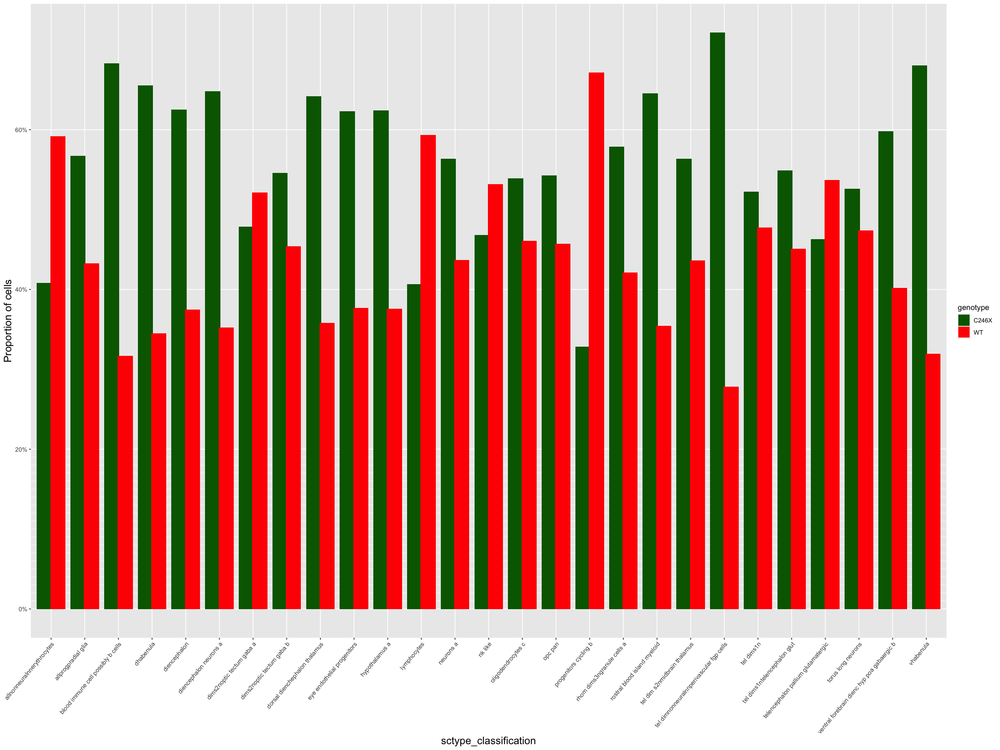

In [88]:
options(repr.plot.width=20, repr.plot.height=15)

# get metadata from the Seurat object
metadata = LOG_NORM_NOVOALL_filt_integ_final@meta.data

# calculate the proportion of cells in each sctype_classification by genotype
metadata_proportions <- metadata %>%
  group_by(genotype, sctype_classification) %>%
  summarise(cell_count = n()) %>%
  group_by(sctype_classification) %>%
  mutate(proportion = cell_count / sum(cell_count))

# create the bar plot
ggplot(metadata_proportions, aes(x = sctype_classification, y = proportion, fill = genotype)) +
  geom_col(position = position_dodge(width = 0.8)) +  # bars side by side
  theme(axis.text.x = element_text(angle = 50, hjust = 1)) + 
  theme(axis.title.x = element_text(size = 15)) + 
  theme(axis.title.y = element_text(size = 15)) +
  labs(y = "Proportion of cells", x = "sctype_classification") +
  scale_y_continuous(minor_breaks = seq(0, 0.20, 0.01), labels = scales::percent) +  # Show y-axis as percentages
  scale_fill_manual(values = c("WT" = "red", "362del" = "lightgreen", "C246X" = "darkgreen")) # Optional: custom color palette

### Filter to chosen classifications

In [118]:
# The following is a list of all the unique sctype classifications available in this dataset
LOG_NORM_NOVOALL_filt_integ_final@meta.data %>% select("sctype_classification") %>% distinct()

,sctype_classification
,<chr>
WT_S1_AGCTGAGTC_ACCAGGTCA_AACAAGTGG,rhom dims3ngranule cells a
WT_S1_CGCCAATGA_ATAGCGTGT_AACAAGTGG,dhabenula
WT_S1_GCTTGAGGT_ATGCCTAAG_AACAAGTGG,lymphocytes
WT_S1_CCTTGAATC_CAATGCAAC_AACAAGTGG,oligodendrocytes c
WT_S1_ACGAAGCTC_CTAACCAGA_AACAAGTGG,ventral forebrain dienc hyp poa gabaergic b
WT_S1_TGCGGTTCT_GAAGAAGCC_AACAAGTGG,tel dim s2nmidbrain thalamus
WT_S1_GCTTGAGGT_GTAATGGAC_AACAAGTGG,blood immune cell possibly b cells
WT_S1_CCTAGTCTT_TAGCGATGA_AACAAGTGG,hypothalamus a
WT_S1_CAGAGTACA_TCTTCTCAG_AACAAGTGG,torus long neurons


In [90]:
# specify the clusters you want to plot
clusters_to_plot = readline(prompt = "Please enter the cluster cell types exactly as they appear in the list that you wish to plot seperated only by a |:")
    # example entry: dHabenula|lymphocytes|NK-like|radial glia|DIMOLOOPC|vHabenula|hypothalamus_A|dHabenula|torus long neurons|DIM, RhomOLOOligodendrocyte

clusters_to_plot = trimws(str_split_1(clusters_to_plot, "\\|"))

Please enter the cluster cell types exactly as they appear in the list that you wish to plot seperated only by a |: dhabenula|lymphocytes|nk like|radial glia|vhabenula|hypothalamus a|torus long neurons|rhom dims3ngranule cells a


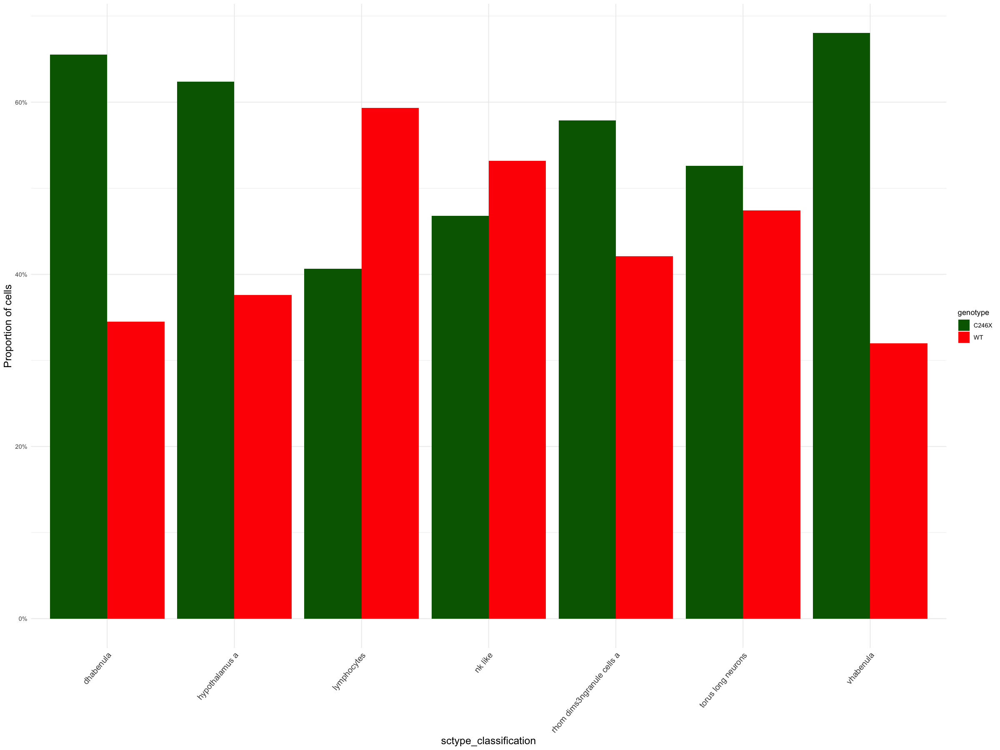

In [91]:
# Filter the metadata to keep only the clusters you want to plot
metadata_proportions_filtered <- metadata_proportions %>%
  filter(sctype_classification %in% clusters_to_plot)

# create the bar plot for the selected clusters
ggplot(metadata_proportions_filtered, aes(x = sctype_classification, y = proportion, fill = genotype)) +
  geom_col(position = position_dodge(width = 0.9)) +  # bars side by side
  theme_minimal() + 
  theme(axis.text.x = element_text(angle = 50, hjust = 1, size = 12)) +  
  theme(axis.title.x = element_text(size = 15)) + 
  theme(axis.title.y = element_text(size = 15)) +
  labs(y = "Proportion of cells", x = "sctype_classification") +
  scale_y_continuous(labels = scales::percent) +  # Show y-axis as percentages
  scale_fill_manual(values = c("WT" = "red", "362del" = "lightgreen", "C246X" = "darkgreen"))  # Optional: custom color palette

## Compare differential expression of cells between conditions within each cluster

In [74]:
# making a distinction between genotypes for each classification
LOG_NORM_NOVOALL_filt_integ_final$celltype.stim <- paste(LOG_NORM_NOVOALL_filt_integ_final$sctype_classification, 
                                                     LOG_NORM_NOVOALL_filt_integ_final$genotype, 
                                                     sep = "_")
Idents(LOG_NORM_NOVOALL_filt_integ_final) <- "celltype.stim"
LOG_NORM_NOVOALL_filt_integ_final = JoinLayers(LOG_NORM_NOVOALL_filt_integ_final)

In [75]:
# save the files with celltype.stim added
saveRDS(LOG_NORM_NOVOALL_filt_integ_final, dir1)

First choose a test and control genotype set (e.g., C246X vs WT) to compare the differential expression of these groups of cells within each cluster. Then define some functions to save the plots and csv files. Then for the custom gene analysis define the single genes and gene sets.

In [77]:
genotype_test = readline(prompt = "Please enter genotype for test set: ") # e.g., C246X 
genotype_control = readline(prompt = "Please enter genotype for control set: ") # e.g., WT

Please enter genotype for test set:  C246X
Please enter genotype for control set:  WT


In [68]:
## Functions to save files and plots (in separate folders for each cluster)

# Save the DEGs to csv files
output_dir_csv = readline(prompt = "Please enter the output directory to save data for csv files produced: ")

# define function that can be used later (bc using custom filename)
save_csv <- function(df, suffix, test, control, gene, output_dir, row_names, cluster) {  # row_names is TRUE or FALSE

  # sanitize all inputs
  safe <- function(x) {
    x <- ifelse(is.null(x) | x == "", "NA", x)
    gsub("[^A-Za-z0-9_\\-]", "_", x)
  }

  test <- safe(test)
  control <- safe(control)
  gene <- safe(gene)
  cluster <- safe(cluster)

  # ensure suffix has extension
  if (!grepl("\\.csv$", suffix)) {
    suffix <- paste0(suffix, ".csv")
  } 

  file_name <- paste(control, "vs", test, gene, suffix, sep = "_")

  output_dir <- paste0(output_dir, "_", cluster)

  # safe directory creation
  dir.create(output_dir, recursive = TRUE, showWarnings = FALSE)

  fullpath <- file.path(output_dir, file_name)

  write.csv(df, file = fullpath, row.names = row_names)
}

# Save volcano plot
output_dir_plots = readline(prompt = "Please enter the output directory to save plots produced: ")

# define function to save the plot
save_plot = function(plot, suffix, test, control, gene, output_dir, width, height, cluster) {

  safe <- function(x) {
    x <- ifelse(is.null(x) | x == "", "NA", x)
    gsub("[^A-Za-z0-9_\\-]", "_", x)
  }

  test <- safe(test)
  control <- safe(control)
  gene <- safe(gene)
  cluster <- safe(cluster)

  if (!grepl("\\.pdf$", suffix)) {
    suffix <- paste0(suffix, ".pdf")
  }

  file_name <- paste(control, "vs", test, gene, suffix, sep = "_")

  output_dir <- paste0(output_dir, "_", cluster) # make a new output dir depending on the cluster

  dir.create(output_dir, recursive = TRUE, showWarnings = FALSE) # create the output dir

  ggsave(
    filename = file_name,
    plot = plot,
    device = pdf,
    path = output_dir,
    width = width,
    height = height
  )
}

Please enter the output directory to save data for csv files produced:  /Users/sadsa/Library/CloudStorage/OneDrive-NationalUniversityofSingapore/NUS/ScRNA/src/Differential Expression Analysis output/New data/CSV files
Please enter the output directory to save plots produced:  /Users/sadsa/Library/CloudStorage/OneDrive-NationalUniversityofSingapore/NUS/ScRNA/src/Differential Expression Analysis output/New data/Plots


In [36]:
# for the custom gene analysis, define the single genes
single_genes = str_split_1(readline(prompt = "Please provide list of genes separated by a comma: "), ",") # chrn,grin,gabr,drd
single_gene_group = str_split_1(readline(prompt = "Please provide the gene groups each single gene corresponds to e.g., for 'grin', provide 'GLUT': "), ",")
p_value_threshold = as.numeric(readline(prompt = "Please provide a p value threshold, e.g., 0.05: "))

Please provide list of genes separated by a comma:  chrn,grin,gabr,drd
Please provide the gene groups each single gene corresponds to e.g., for 'grin', provide 'GLUT':  GLUT,GABA,Acetylcholine,Dopamine
Please provide a p value threshold, e.g., 0.05:  0.05


In [58]:
# dir where the custom gene sets file is saved
dir = readline(prompt = "Please enter the directory where the custom gene sets file is saved: ")

# import custom gene sets in 
custom_gene_sets = read_excel(dir)
    
# extract gene sets and keep the gene set names from the first column
gene_sets_list = apply(custom_gene_sets, 1, function(x) na.omit(as.character(x[2:length(x)])))
    
# assign the gene set names as the names of the list
names(gene_sets_list) = custom_gene_sets$set_name

# get set names of the genes of interest
genes_of_interest = custom_gene_sets %>% filter(str_detect(set_name, regex(paste(single_gene_group, collapse = "|"), 
                                                                                     ignore_case = TRUE))) %>% # get the sets of interest by filtering using user input of genes of interest as pattern
                                           pivot_longer(cols = -1, names_to = " ", values_to = "Genes") %>%
                                           drop_na(Genes) %>%
                                           pull(Genes)

Please enter the directory where the custom gene sets file is saved:  ../raw_data/custom_gene_sets.xlsx


New names:
• `` -> `...2`
• `` -> `...3`
• `` -> `...4`
• `` -> `...5`
• `` -> `...6`
• `` -> `...7`
• `` -> `...8`
• `` -> `...9`
• `` -> `...10`
• `` -> `...11`
• `` -> `...12`
• `` -> `...13`
• `` -> `...14`
• `` -> `...15`
• `` -> `...16`
• `` -> `...17`
• `` -> `...18`
• `` -> `...19`
• `` -> `...20`
• `` -> `...21`
• `` -> `...22`
• `` -> `...23`
• `` -> `...24`
• `` -> `...25`
• `` -> `...26`
• `` -> `...27`
• `` -> `...28`
• `` -> `...29`
• `` -> `...30`
• `` -> `...31`
• `` -> `...32`
• `` -> `...33`
• `` -> `...34`
• `` -> `...35`
• `` -> `...36`
• `` -> `...37`


In [74]:
options(repr.plot.width=20, repr.plot.height=10)

all_volcano_plots  = list()  # per-cluster single-gene plots
all_volcano_plots2 = list()  # per-cluster gene-set plots

for (cluster in clusters_to_plot) {

    # Define test and control sets for comparison
    Test = paste0(cluster, "_", genotype_test)
    Control = paste0(cluster, "_", genotype_control)

    # Check whether the Test and Control sets exist in the file 
    if (!(Test %in% LOG_NORM_NOVOALL_filt_integ_final$celltype.stim) || !(Control %in% LOG_NORM_NOVOALL_filt_integ_final$celltype.stim)){
        message("Skipping ", cluster, " because one or both identities are missing: ", Test, ", ", Control)
        next
        }

    #### All genes - Differentially expressed genes (DEGs), volcano plots, GSEA ####
    
    # Identify differentially expressed genes between Test and Control
    mono.de <- FindMarkers(LOG_NORM_NOVOALL_filt_integ_final, 
                           ident.1 = Test, 
                           ident.2 = Control, # this should be control as ident.1 is compared to ident.2
                           verbose = FALSE)
    
    de_genes_sorted <- mono.de[order(mono.de$avg_log2FC), ] # sort downregulated --> upregulated
    de_genes_sig_output <- de_genes_sorted[de_genes_sorted$p_val_adj <= 0.05, ] # filter to take only the significant ones

    # save the csv files
    save_csv(de_genes_sorted, "All_DEGs.csv", Test, Control, gene = "", output_dir_csv, TRUE, cluster = cluster) # save all DEGs
    save_csv(de_genes_sig_output, "All_DEGs_pAdj005.csv", Test, Control, gene = "", output_dir_csv, TRUE, cluster = cluster) # save only significant DEGs

    ### Volcano plot ###
    # create custom key-value pairs for 'high', 'low', 'mid' expression by fold-change
    custom_keyvals = function(df) {
        keyvals = case_when(
            df$avg_log2FC < -1 & df$p_val_adj <= 0.05 ~ "Downregulated",
            df$avg_log2FC > 1 & df$p_val_adj <= 0.05 ~ "Upregulated",
            df$avg_log2FC > -1 & df$avg_log2FC < 0 & df$p_val_adj <= 0.05 ~ "Provisionally downregulated",
            df$avg_log2FC < 1 & df$avg_log2FC > 0 & df$p_val_adj <= 0.05 ~ "Provisionally upregulated",
            df$p_val_adj > 0.05 ~ "Not significant"
        )
    
        colour_map = c(
          "Upregulated" = "red3",
          "Downregulated" = "navyblue",
          "Provisionally upregulated" = "orangered2",
          "Provisionally downregulated" = "steelblue1",
          "Not significant" = "grey70"
          )
    
        keyvals_coloured = unname(colour_map[keyvals])
        names(keyvals_coloured) = keyvals
    
        return(keyvals_coloured)
    }
    
    all_genes_volcano = EnhancedVolcano(de_genes_sorted,
                    lab = rownames(de_genes_sorted),
                    x = 'avg_log2FC', y = 'p_val',
                    selectLab = rownames(de_genes_sorted)[which(names(custom_keyvals(de_genes_sorted)) %in% c('Upregulated', 'Downregulated'))],
                    #xlab = bquote(~Log[2]~ 'fold change'),
                    title = paste(Control, "vs", Test, "(All_genes)", sep = " "),
                    #pCutoff = 10e-14,
                    #FCcutoff = 1.0,
                    pointSize = 5, labSize = 4.5,
                    xlim = c(-10,10), ylim = c(0,100),
                    #shape = c(6, 4, 2, 11),
                    colCustom = custom_keyvals(de_genes_sorted),
                    colAlpha = 1,
                    legendPosition = 'right', legendLabSize = 15, legendIconSize = 5.0,
                    #drawConnectors = TRUE,
                    #widthConnectors = 1.0,
                    #colConnectors = 'black',
                    #arrowheads = FALSE,
                    #gridlines.major = TRUE,
                    #gridlines.minor = FALSE,
                    #border = 'partial',
                    #borderWidth = 1.5,
                    #borderColour = 'black'
        )

    # view the plot in line here 
    all_genes_volcano

    # save the volcano plot using the function
    save_plot(all_genes_volcano, "ALL_genes_volcano.pdf", Test, Control, gene = "", output_dir_plots, width = 15, height = 8.27, cluster = cluster)

    ### GSEA output table and plot ###

    # Get output table
    zf_gene_sets = msigdbr(species = "Danio rerio", category = "C5", subcategory = "GO:BP") # online
    
    msigdbr_list = split(x = zf_gene_sets$gene_symbol, f = zf_gene_sets$gs_name)
    
    rankings <- sign(de_genes_sorted$avg_log2FC)*(-log10(de_genes_sorted$p_val)) # we will use the signed p values from spatial DGE as ranking
    de_genes_sorted$gene <- rownames(de_genes_sorted)
    names(rankings) <- de_genes_sorted$gene # genes as names
    head(rankings)
    rankings <- sort(rankings, decreasing = TRUE) # sort genes by ranking
    
    max_ranking <- max(rankings[is.finite(rankings)])
    min_ranking <- min(rankings[is.finite(rankings)])
    rankings <- replace(rankings, rankings > max_ranking, max_ranking * 10)
    rankings <- replace(rankings, rankings < min_ranking, min_ranking * 10)
    rankings <- sort(rankings, decreasing = TRUE) # sort genes by ranking
    
    GSEA_output_table = fgsea(pathways = msigdbr_list, # List of gene sets to check
                     stats = rankings,
                     scoreType = 'std', # in this case we have both pos and neg rankings. if only pos or neg, set to 'pos', 'neg'
                     minSize = 10,
                     maxSize = 500,
                     nproc = 1) # for parallelisation
    
    GSEA_output_table = as.data.frame(GSEA_output_table) %>%
                                            arrange(desc(NES)) %>% # descending order in terms of normalised enrichment score
                                            mutate(leadingEdge = sapply(leadingEdge, function(x) paste(x, collapse = ","))) # leading edge is list of genes in that pathway that contributed most to the enrichment score
                                                                        
    GSEA_output_df_sig = GSEA_output_table %>% filter(padj <= 0.05) # filter for significant

    # Save the GSEA output tables to csv files
    save_csv(GSEA_output_table, "GSEA.csv", Test, Control, gene = "", output_dir_csv, FALSE, cluster = cluster)
    save_csv(GSEA_output_df_sig, "GSEA_pAdj005.csv", Test, Control, gene = "", output_dir_csv, FALSE, cluster = cluster)

    # GSEA Plot
    options(repr.plot.width=15, repr.plot.height=15)
    
    gsea_plot = ggplot(GSEA_output_df_sig, aes(x = reorder(pathway, NES), y = NES, fill = NES)) + 
      geom_bar(stat = "identity") +
      ylim(-2.5, 2.5) +
      coord_flip() +
      scale_fill_gradient2(low = "blue", mid = "pink", high = "red", midpoint = 0) +
      theme_minimal()

    # View the plot in line here                                                                     
    gsea_plot 
                                                                        
    # Save the GSEA plot 
    save_plot(gsea_plot, "GSEA_plot.pdf", Test, Control, gene = "", output_dir_plots, width = 15, height = 15, cluster = cluster)

    #### Custom gene analysis (single gene) ####

    ## Plot for all genes of interest ##
                                                                        
    # subset data for genes of interest
    subset = de_genes_sorted %>% filter(rownames(de_genes_sorted) %in% genes_of_interest)
                                                                        
    # save the DEG csv file for this gene
    save_csv(subset, "Selected_DEGs.csv", Test, Control, gene = "", output_dir_csv, TRUE, cluster = cluster)

    # generate custom key-value pairs for expression using function from before
    keyvals = custom_keyvals(subset)
    transparent_color <- rgb(0, 0, 0, alpha = 0)  # Transparent black color    

    # volcano plot
    p_interest = EnhancedVolcano(subset,
                      lab = rownames(subset),
                      x = 'avg_log2FC',
                      y = 'p_val',
                      selectLab = rownames(subset)[which(names(keyvals) %in% c('Upregulated', 'Downregulated', 'Provisionally upregulated', 'Provisionally downregulated'))],
                      xlab = bquote(~Log[2]~ 'fold change'),
                      title = "Selected genes",
                      pointSize = 5,
                      labSize = 6,
                      xlim = c(-10,10),
                      ylim = c(0,100),
                      colCustom = keyvals,
                      colAlpha = 1,
                      legendPosition = 'right',
                      legendLabSize = 15,
                      legendIconSize = 5.0,
                      drawConnectors = FALSE,
                      widthConnectors = 1.0,
                      colConnectors = transparent_color,
                      arrowheads = FALSE,
                      labCol = 'black')                                                                   
    
    # save the plot
    save_plot(p_interest, "Selected_genes_volcano_plot.pdf", Test, Control, gene = "", output_dir_plots, width = 15, height = 10, cluster = cluster)

    ## Individual plots ##
    cluster_volcano_plots = list()  # list for THIS cluster                                                                     
    for (gene in single_genes) {
        
        # subset the data for the specific gene
        de_subset_temp = de_genes_sorted[grep(gene, rownames(de_genes_sorted)), ]

        # skip if this gene is not found
        if (nrow(de_subset_temp) == 0) {
         message("No rows found for gene '", gene, "' in cluster ", cluster, ". Skipping.")
         next
          }
    
        # save the DEG csv file for this gene
        save_csv(de_subset_temp, ".csv", Test, Control, gene = gene, output_dir_csv, TRUE, cluster = cluster)
    
        # generate custom key-value pairs for expression using function from before
        keyvals = custom_keyvals(de_subset_temp)
        transparent_color <- rgb(0, 0, 0, alpha = 0)  # Transparent black color
    
        # volcano plot
        p = EnhancedVolcano(de_subset_temp,
                      lab = rownames(de_subset_temp),
                      x = 'avg_log2FC',
                      y = 'p_val',
                      selectLab = rownames(de_subset_temp)[which(names(keyvals) %in% c('Upregulated', 'Downregulated', 'Provisionally upregulated', 'Provisionally downregulated'))],
                      xlab = bquote(~Log[2]~ 'fold change'),
                      title = gene,
                      pointSize = 5,
                      labSize = 6,
                      xlim = c(-10,10),
                      ylim = c(0,100),
                      colCustom = keyvals,
                      colAlpha = 1,
                      legendPosition = 'right',
                      legendLabSize = 15,
                      legendIconSize = 5.0,
                      drawConnectors = FALSE,
                      widthConnectors = 1.0,
                      colConnectors = transparent_color,
                      arrowheads = FALSE,
                      labCol = 'black')
    
        cluster_volcano_plots[[paste0("plot", gene)]] = p  
        all_volcano_plots[[cluster]] = cluster_volcano_plots # save to big list to make the grid plot later
    
        save_plot(p, "volcano_plot.pdf", Test, Control, gene = gene, output_dir_plots, width = 15, height = 10, cluster = cluster)

        }

    #### Custom gene analysis (gene sets) ####                                                                

    # Volcano plots 
    cluster_volcano_plots2 = list()

    for (name in names(gene_sets_list)) {

        # get the gene set for gene 
        gene_set = gene_sets_list[[name]]
    
        # Exact match of genes from the gene set in the row names of de_genes_sorted
        matched_genes = match(gene_set, rownames(de_genes_sorted))
    
        # remove NAs (genes not found)
        matched_genes = matched_genes[!is.na(matched_genes)]
        
        # check if any genes from the gene set are found
        if(length(matched_genes) == 0) {
            message("No genes from the gene set ", name, " found in the data.")
            next # move on
        }
    
        # subset the data using the matched genes
        de_subset_temp <- de_genes_sorted[matched_genes, , drop = FALSE]
    
        # save the DEGs csv file for this gene set
        save_csv(de_subset_temp, ".csv", Test, Control, gene = name, output_dir_csv, TRUE, cluster = cluster)
    
        # custom keyvals 
        keyvals = custom_keyvals(de_subset_temp)
        transparent_color <- rgb(0, 0, 0, alpha = 0)  # transparent black color
    
        # volcano plots
        p = EnhancedVolcano(de_subset_temp,
                      lab = rownames(de_subset_temp),
                      x = 'avg_log2FC',
                      y = 'p_val',
                      selectLab = rownames(de_subset_temp)[which(names(keyvals) %in% c('Upregulated', 'Downregulated', 'Provisionally upregulated', 'Provisionally downregulated'))],
                      xlab = bquote(~Log[2]~ 'fold change'),
                      title = name,
                      pointSize = 5,
                      labSize = 6,
                      xlim = c(-10,10),
                      ylim = c(0,100),
                      colCustom = keyvals,
                      colAlpha = 1,
                      legendPosition = 'right',
                      legendLabSize = 15,
                      legendIconSize = 5.0,
                      drawConnectors = FALSE,
                      widthConnectors = 1.0,
                      colConnectors = transparent_color,
                      arrowheads = FALSE,
                      labCol = 'black')
    
        cluster_volcano_plots2[[paste0("plot", name)]] = p
        all_volcano_plots2[[cluster]] = cluster_volcano_plots2 # save to big list to make the grid plot later
    
        save_plot(p, "volcano_plot.pdf", Test, Control, gene = name, output_dir_plots, width = 15, height = 10, cluster = cluster)
    }
                                                                            
    }

  |======================================================================| 100%



No genes from the gene set Acetylcholine presynapse found in the data.

Warning message in preparePathwaysAndStats(pathways, stats, minSize, maxSize, gseaParam, :
“There are ties in the preranked stats (53.9% of the list).
The order of those tied genes will be arbitrary, which may produce unexpected results.”


  |======================================================================| 100%



Warning message in preparePathwaysAndStats(pathways, stats, minSize, maxSize, gseaParam, :
“There are ties in the preranked stats (2.25% of the list).
The order of those tied genes will be arbitrary, which may produce unexpected results.”


  |======================================================================| 100%



Warning message in preparePathwaysAndStats(pathways, stats, minSize, maxSize, gseaParam, :
“There are ties in the preranked stats (0.72% of the list).
The order of those tied genes will be arbitrary, which may produce unexpected results.”


  |======================================================================| 100%



No rows found for gene 'chrn' in cluster oligodendrocytes_C. Skipping.

No genes from the gene set Acetylcholine receptors found in the data.

Warning message in preparePathwaysAndStats(pathways, stats, minSize, maxSize, gseaParam, :
“There are ties in the preranked stats (8.61% of the list).
The order of those tied genes will be arbitrary, which may produce unexpected results.”


  |======================================================================| 100%



Warning message in preparePathwaysAndStats(pathways, stats, minSize, maxSize, gseaParam, :
“There are ties in the preranked stats (0.67% of the list).
The order of those tied genes will be arbitrary, which may produce unexpected results.”


  |======================================================================| 100%



Warning message in preparePathwaysAndStats(pathways, stats, minSize, maxSize, gseaParam, :
“There are ties in the preranked stats (58.64% of the list).
The order of those tied genes will be arbitrary, which may produce unexpected results.”


  |======================================================================| 100%



Warning message in preparePathwaysAndStats(pathways, stats, minSize, maxSize, gseaParam, :
“There are ties in the preranked stats (28.04% of the list).
The order of those tied genes will be arbitrary, which may produce unexpected results.”


  |======================================================================| 100%



Warning message in preparePathwaysAndStats(pathways, stats, minSize, maxSize, gseaParam, :
“There are ties in the preranked stats (12.24% of the list).
The order of those tied genes will be arbitrary, which may produce unexpected results.”


  |======================================================================| 100%



Warning message in preparePathwaysAndStats(pathways, stats, minSize, maxSize, gseaParam, :
“There are ties in the preranked stats (1.99% of the list).
The order of those tied genes will be arbitrary, which may produce unexpected results.”


  |======================================================================| 100%



No genes from the gene set Acetylcholine presynapse found in the data.

Warning message in preparePathwaysAndStats(pathways, stats, minSize, maxSize, gseaParam, :
“There are ties in the preranked stats (35.37% of the list).
The order of those tied genes will be arbitrary, which may produce unexpected results.”


  |======================================================================| 100%



Warning message:
“Removed 1 row containing missing values or values outside the scale range
(`geom_bar()`).”
No rows found for gene 'chrn' in cluster ALLNonNeuralNNErythrocytes. Skipping.

No genes from the gene set Acetylcholine receptors found in the data.

Warning message in preparePathwaysAndStats(pathways, stats, minSize, maxSize, gseaParam, :
“There are ties in the preranked stats (21.71% of the list).
The order of those tied genes will be arbitrary, which may produce unexpected results.”


  |======================================================================| 100%



No genes from the gene set Acetylcholine presynapse found in the data.

Warning message in preparePathwaysAndStats(pathways, stats, minSize, maxSize, gseaParam, :
“There are ties in the preranked stats (16.47% of the list).
The order of those tied genes will be arbitrary, which may produce unexpected results.”


  |======================================================================| 100%



Warning message in preparePathwaysAndStats(pathways, stats, minSize, maxSize, gseaParam, :
“There are ties in the preranked stats (50.56% of the list).
The order of those tied genes will be arbitrary, which may produce unexpected results.”
Warning message in fgseaMultilevel(pathways = pathways, stats = stats, minSize = minSize, :
“There were 1 pathways for which P-values were not calculated properly due to unbalanced (positive and negative) gene-level statistic values. For such pathways pval, padj, NES, log2err are set to NA. You can try to increase the value of the argument nPermSimple (for example set it nPermSimple = 10000)”


  |======================================================================| 100%



Warning message in preparePathwaysAndStats(pathways, stats, minSize, maxSize, gseaParam, :
“There are ties in the preranked stats (33.14% of the list).
The order of those tied genes will be arbitrary, which may produce unexpected results.”


  |======================================================================| 100%



Warning message in preparePathwaysAndStats(pathways, stats, minSize, maxSize, gseaParam, :
“There are ties in the preranked stats (18.13% of the list).
The order of those tied genes will be arbitrary, which may produce unexpected results.”


  |======================================================================| 100%



Warning message in preparePathwaysAndStats(pathways, stats, minSize, maxSize, gseaParam, :
“There are ties in the preranked stats (21.34% of the list).
The order of those tied genes will be arbitrary, which may produce unexpected results.”
Warning message in fgseaMultilevel(pathways = pathways, stats = stats, minSize = minSize, :
“There were 2 pathways for which P-values were not calculated properly due to unbalanced (positive and negative) gene-level statistic values. For such pathways pval, padj, NES, log2err are set to NA. You can try to increase the value of the argument nPermSimple (for example set it nPermSimple = 10000)”


  |======================================================================| 100%



Warning message in preparePathwaysAndStats(pathways, stats, minSize, maxSize, gseaParam, :
“There are ties in the preranked stats (53.75% of the list).
The order of those tied genes will be arbitrary, which may produce unexpected results.”


  |======================================================================| 100%



No genes from the gene set Dopamine receptors found in the data.

Warning message in preparePathwaysAndStats(pathways, stats, minSize, maxSize, gseaParam, :
“There are ties in the preranked stats (44.3% of the list).
The order of those tied genes will be arbitrary, which may produce unexpected results.”


  |======================================================================| 100%



Warning message in preparePathwaysAndStats(pathways, stats, minSize, maxSize, gseaParam, :
“There are ties in the preranked stats (28.62% of the list).
The order of those tied genes will be arbitrary, which may produce unexpected results.”


  |======================================================================| 100%



Warning message in preparePathwaysAndStats(pathways, stats, minSize, maxSize, gseaParam, :
“There are ties in the preranked stats (73.59% of the list).
The order of those tied genes will be arbitrary, which may produce unexpected results.”
Warning message in fgseaMultilevel(pathways = pathways, stats = stats, minSize = minSize, :
“There were 1 pathways for which P-values were not calculated properly due to unbalanced (positive and negative) gene-level statistic values. For such pathways pval, padj, NES, log2err are set to NA. You can try to increase the value of the argument nPermSimple (for example set it nPermSimple = 10000)”


  |======================================================================| 100%



Warning message in fgseaMultilevel(pathways = pathways, stats = stats, minSize = minSize, :
“For some of the pathways the P-values were likely overestimated. For such pathways log2err is set to NA.”
Warning message in preparePathwaysAndStats(pathways, stats, minSize, maxSize, gseaParam, :
“There are ties in the preranked stats (59.35% of the list).
The order of those tied genes will be arbitrary, which may produce unexpected results.”


  |======================================================================| 100%



Warning message in preparePathwaysAndStats(pathways, stats, minSize, maxSize, gseaParam, :
“There are ties in the preranked stats (76.31% of the list).
The order of those tied genes will be arbitrary, which may produce unexpected results.”


  |======================================================================| 100%



Warning message:
“Removed 2 rows containing missing values or values outside the scale range
(`geom_bar()`).”
Warning message in preparePathwaysAndStats(pathways, stats, minSize, maxSize, gseaParam, :
“There are ties in the preranked stats (75.68% of the list).
The order of those tied genes will be arbitrary, which may produce unexpected results.”
Warning message in fgseaMultilevel(pathways = pathways, stats = stats, minSize = minSize, :
“There were 20 pathways for which P-values were not calculated properly due to unbalanced (positive and negative) gene-level statistic values. For such pathways pval, padj, NES, log2err are set to NA. You can try to increase the value of the argument nPermSimple (for example set it nPermSimple = 10000)”


  |======================================================================| 100%



Warning message in preparePathwaysAndStats(pathways, stats, minSize, maxSize, gseaParam, :
“There are ties in the preranked stats (84.44% of the list).
The order of those tied genes will be arbitrary, which may produce unexpected results.”


  |======================================================================| 100%



No genes from the gene set Acetylcholine presynapse found in the data.

Warning message in preparePathwaysAndStats(pathways, stats, minSize, maxSize, gseaParam, :
“There are ties in the preranked stats (76.74% of the list).
The order of those tied genes will be arbitrary, which may produce unexpected results.”
Warning message in fgseaMultilevel(pathways = pathways, stats = stats, minSize = minSize, :
“There were 1 pathways for which P-values were not calculated properly due to unbalanced (positive and negative) gene-level statistic values. For such pathways pval, padj, NES, log2err are set to NA. You can try to increase the value of the argument nPermSimple (for example set it nPermSimple = 10000)”


  |======================================================================| 100%



Warning message in preparePathwaysAndStats(pathways, stats, minSize, maxSize, gseaParam, :
“There are ties in the preranked stats (87.91% of the list).
The order of those tied genes will be arbitrary, which may produce unexpected results.”


  |======================================================================| 100%



No genes from the gene set Acetylcholine presynapse found in the data.



### Optional: viewing the volcano plots for custom single genes and gene sets in-line here for each cluster

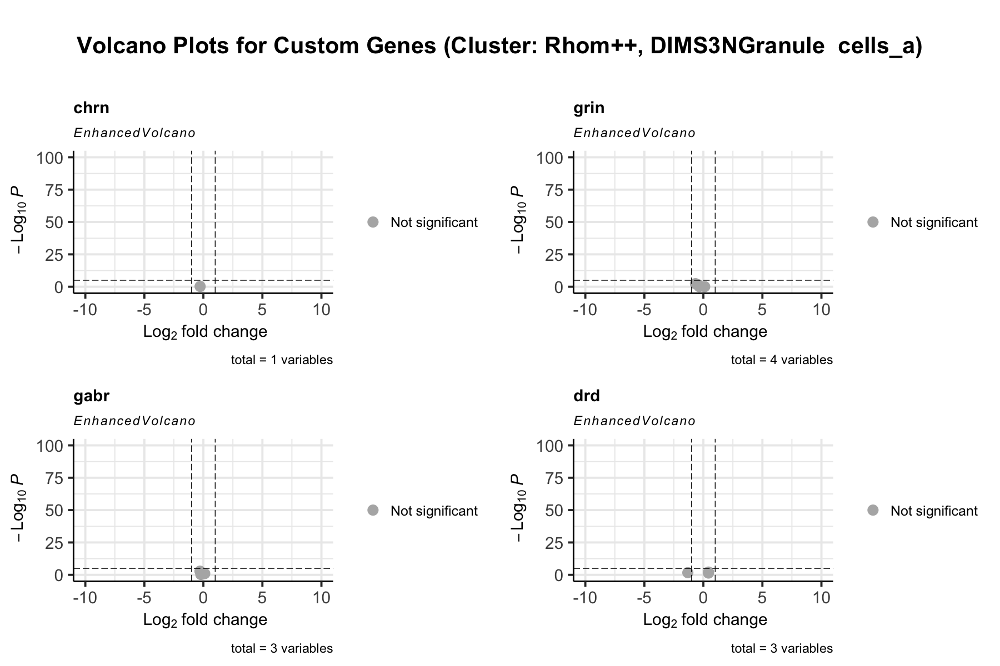

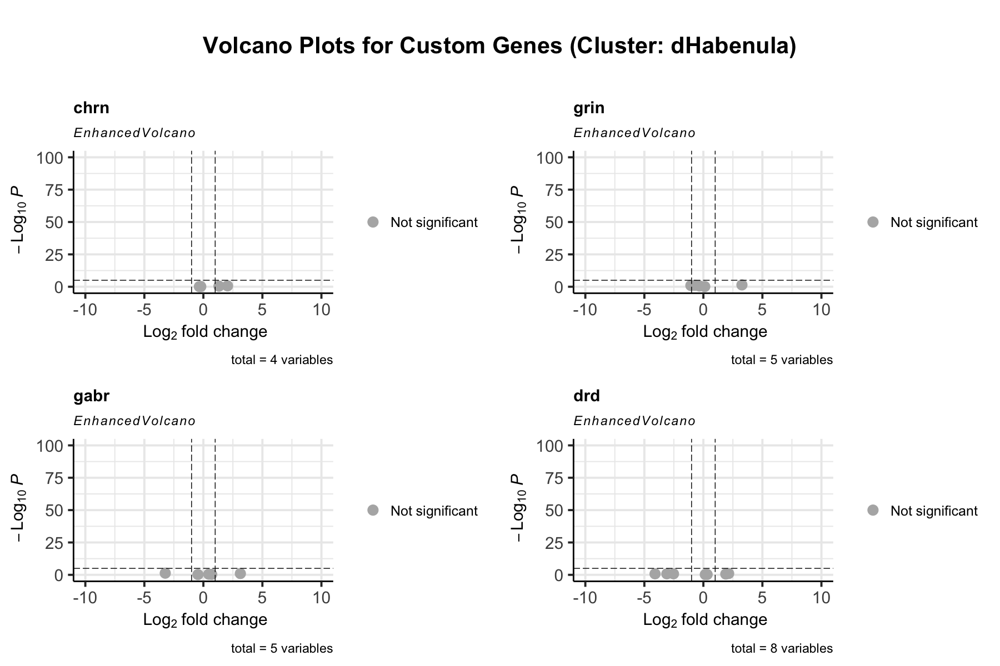

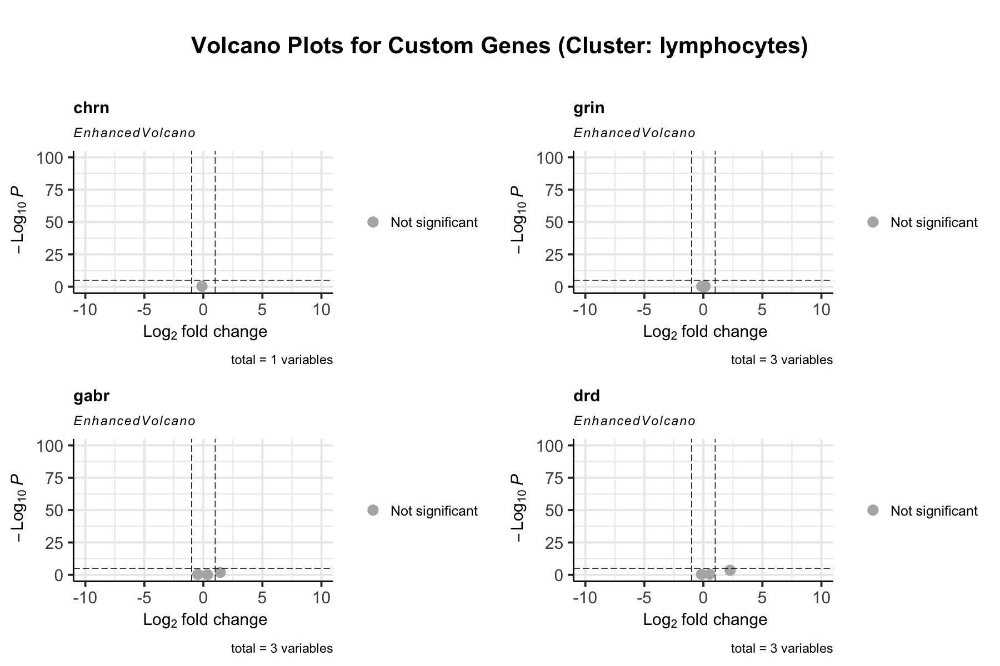

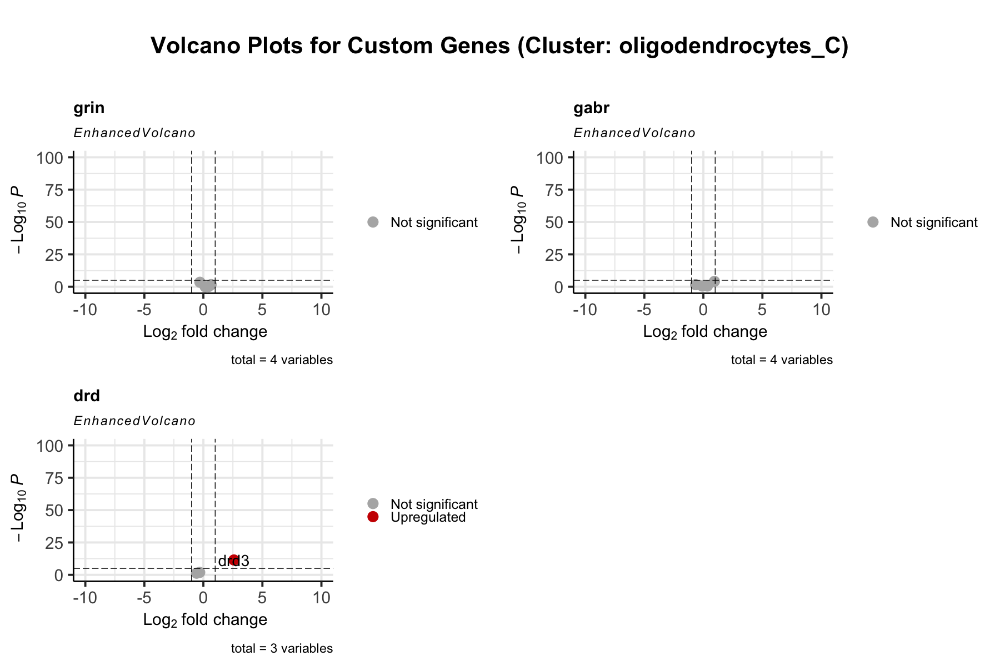

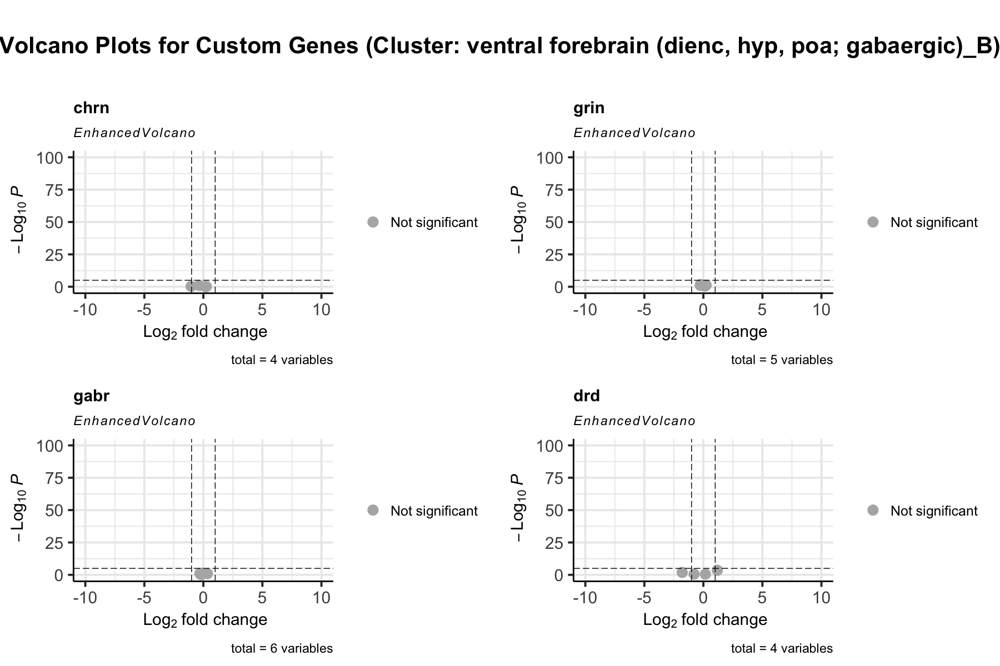

...

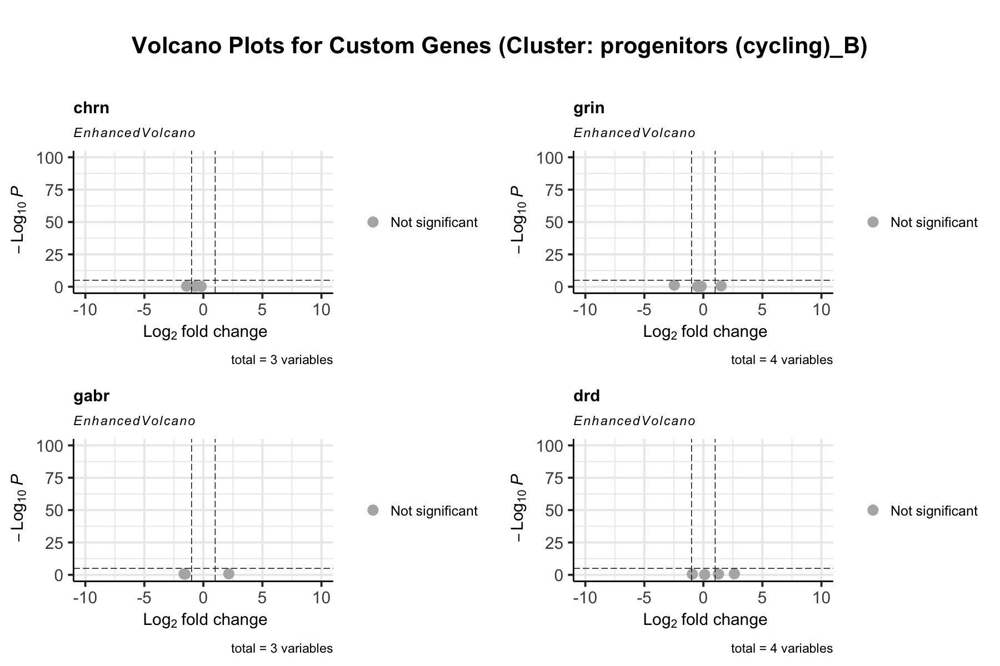

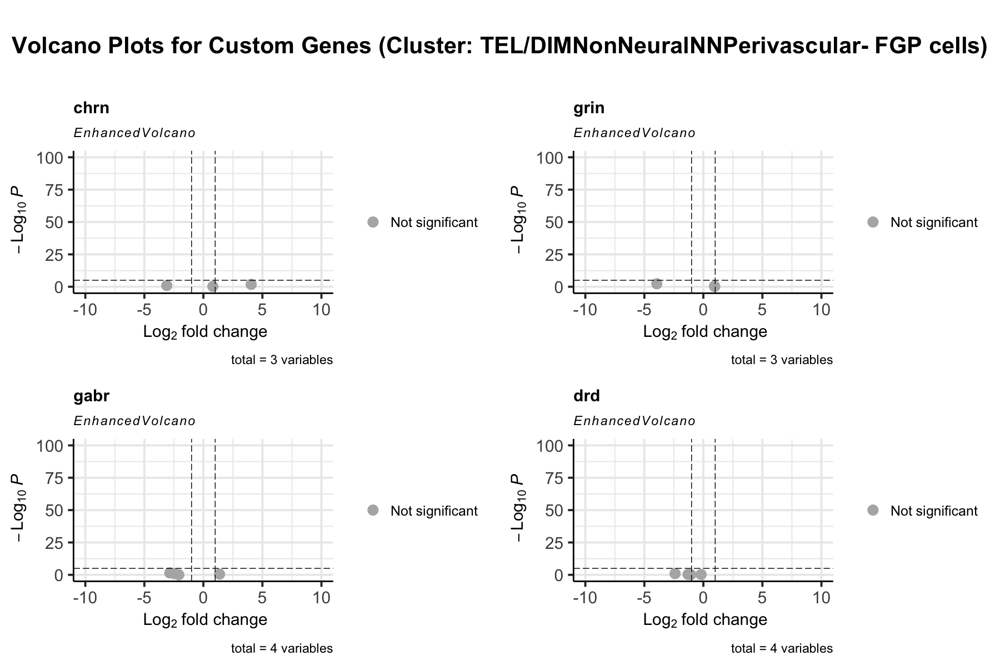

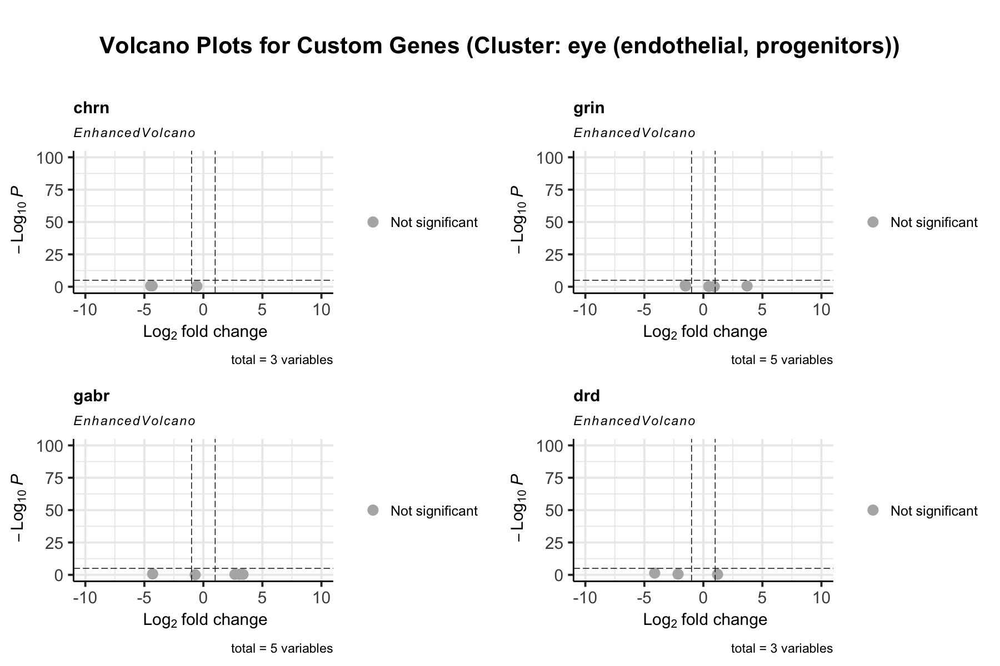

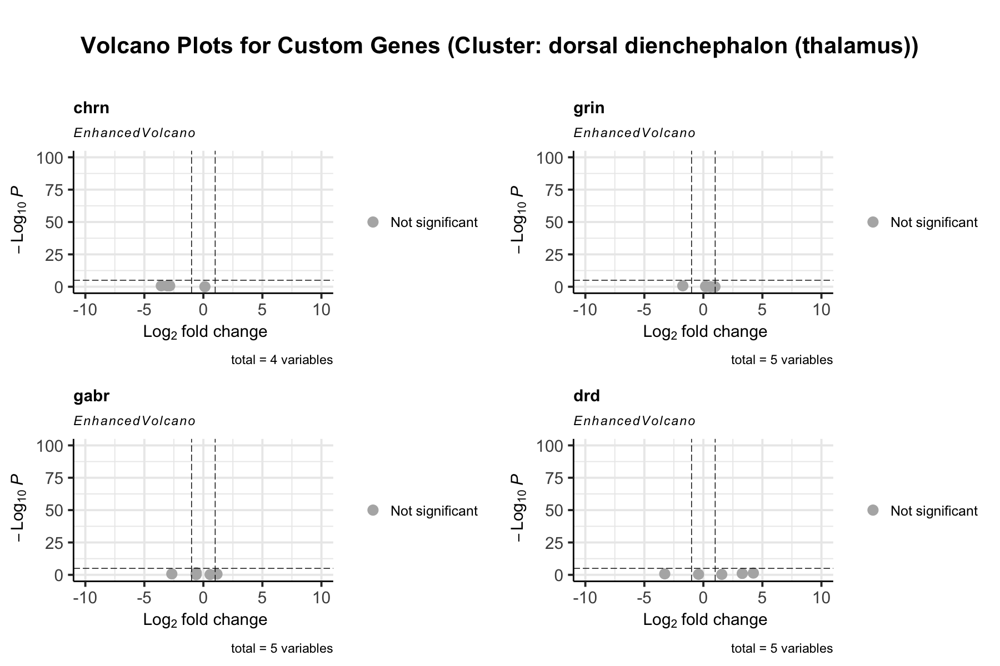

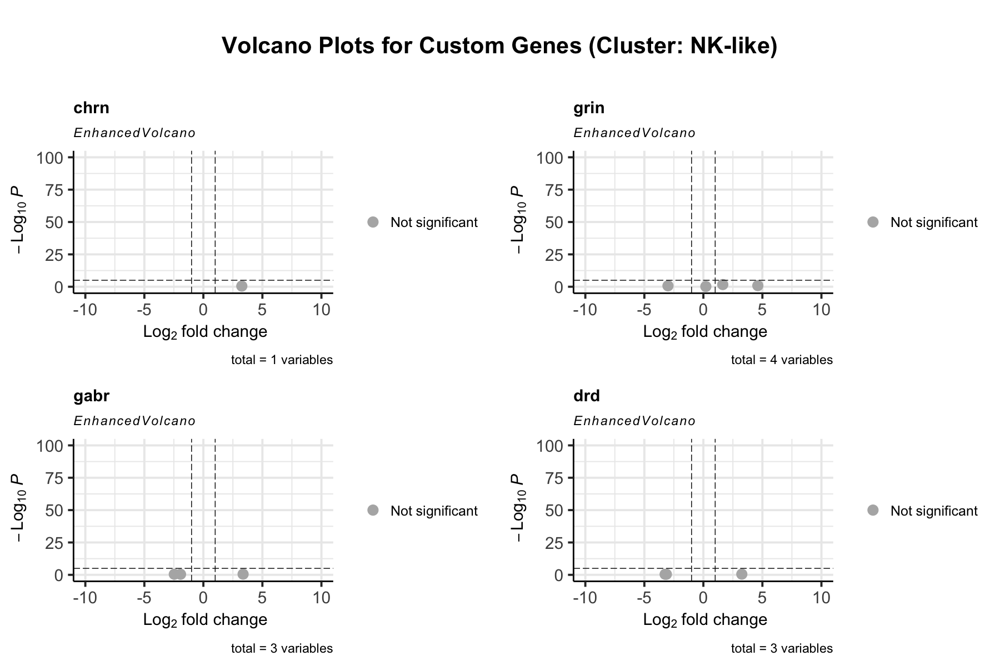

In [75]:
options(repr.plot.height = 10, repr.plot.width = 15)

# Single-gene volcano grids, per cluster
for (cluster in names(all_volcano_plots)) {
  vp = all_volcano_plots[[cluster]]

  if (length(vp) == 0) {
    next
  }

  grid.arrange(
    grobs = vp,
    ncol = ceiling(length(vp)/2),
    top = textGrob(
      paste0("\nVolcano Plots for Custom Genes (Cluster: ", cluster, ")\n"),
      gp = gpar(fontsize = 25, fontface = "bold")
    )
  )
}

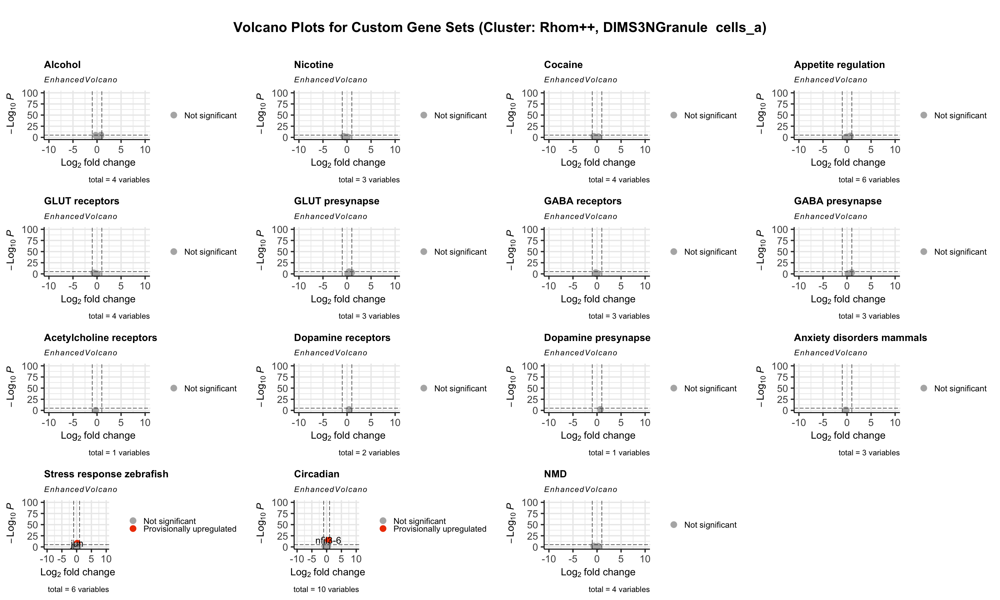

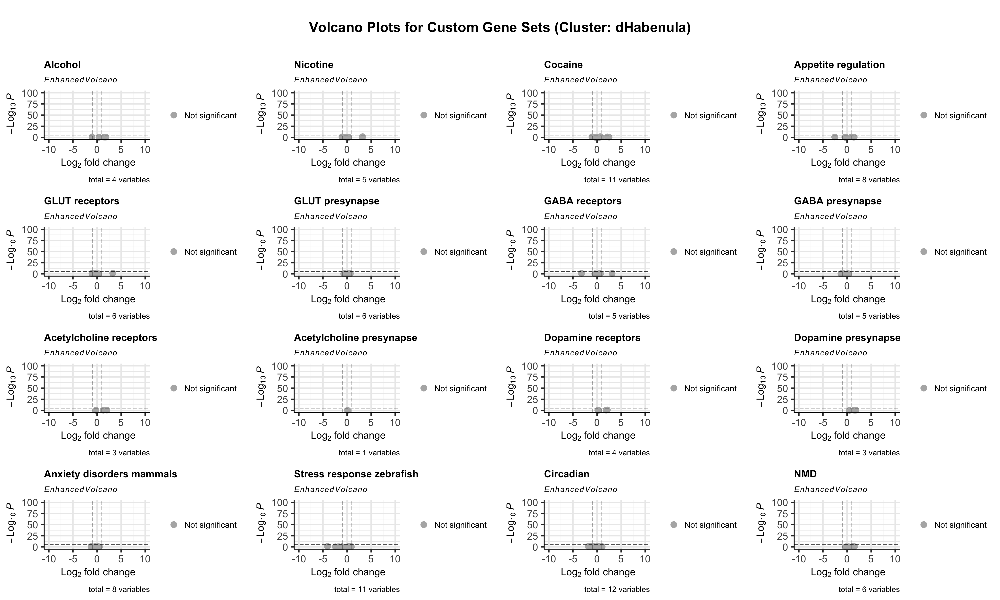

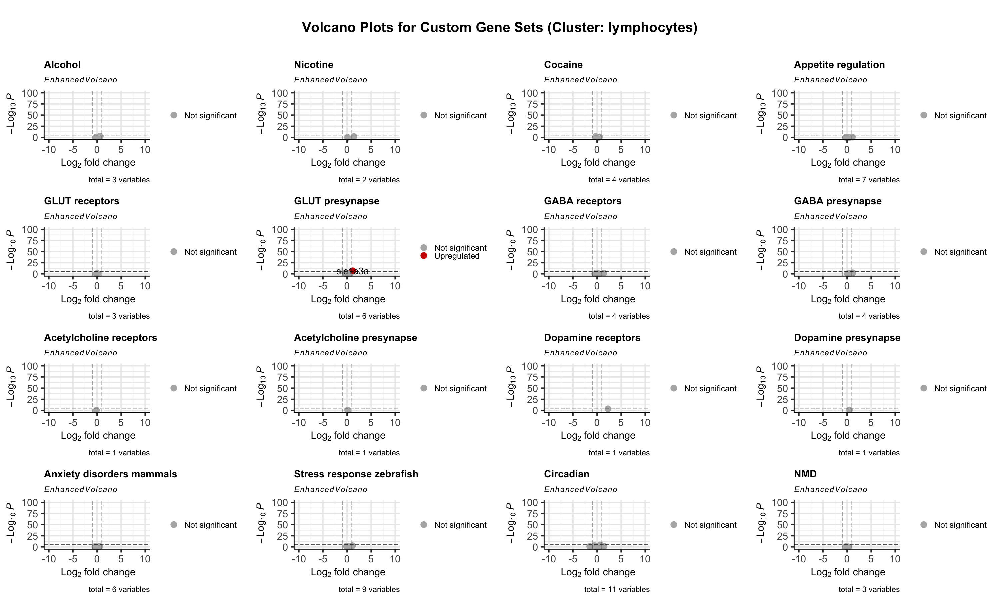

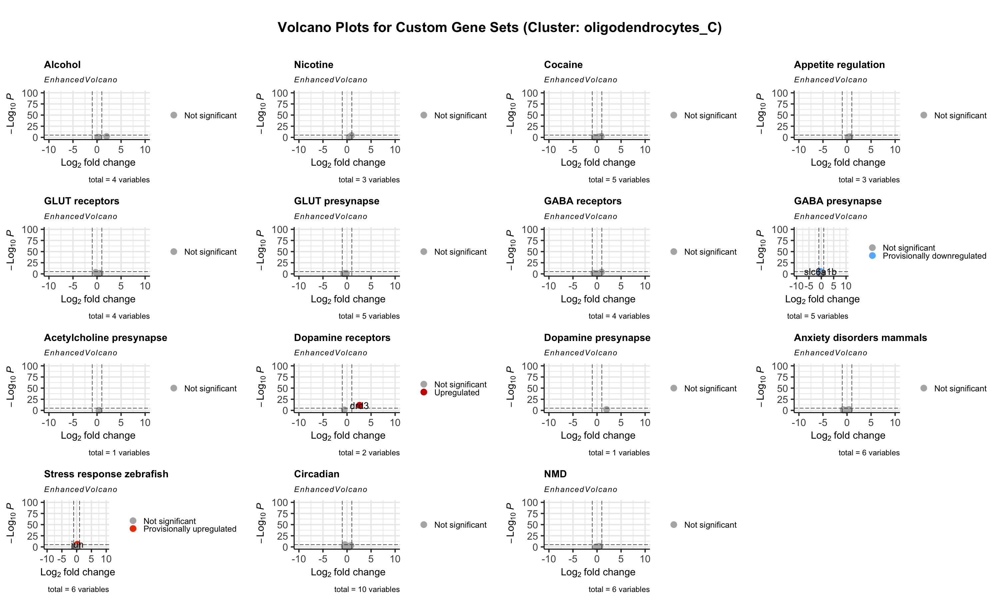

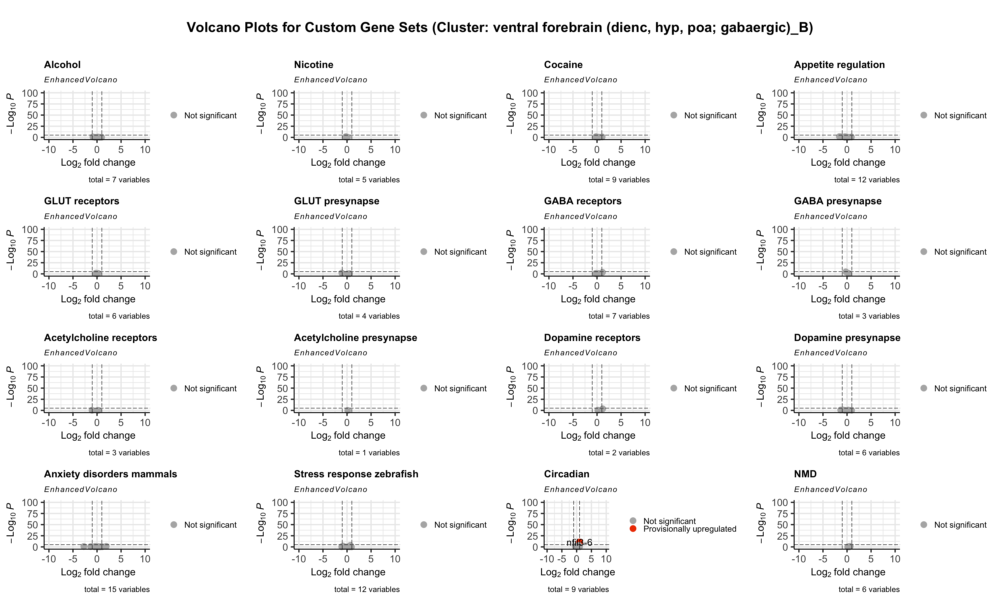

...

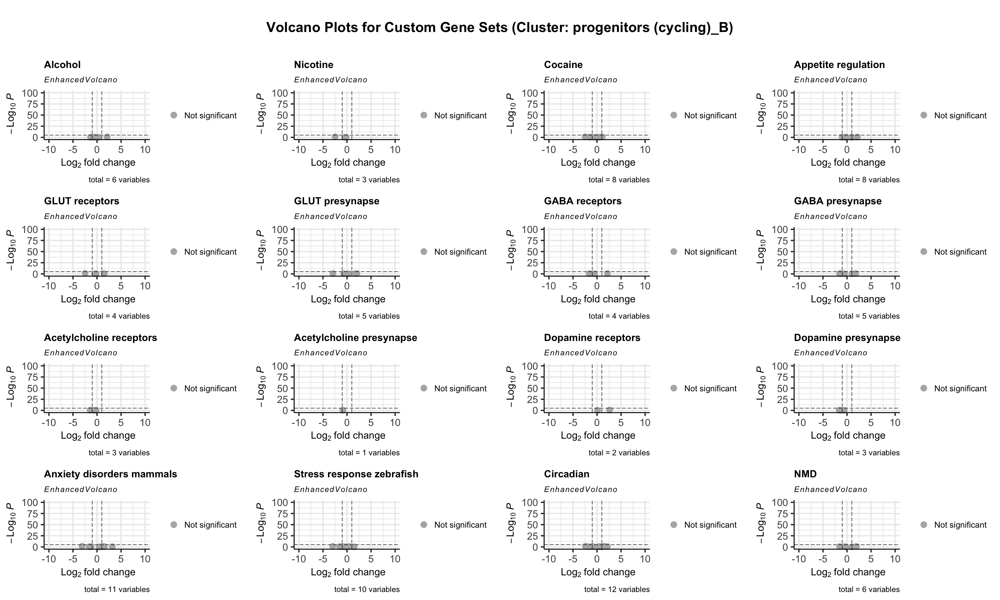

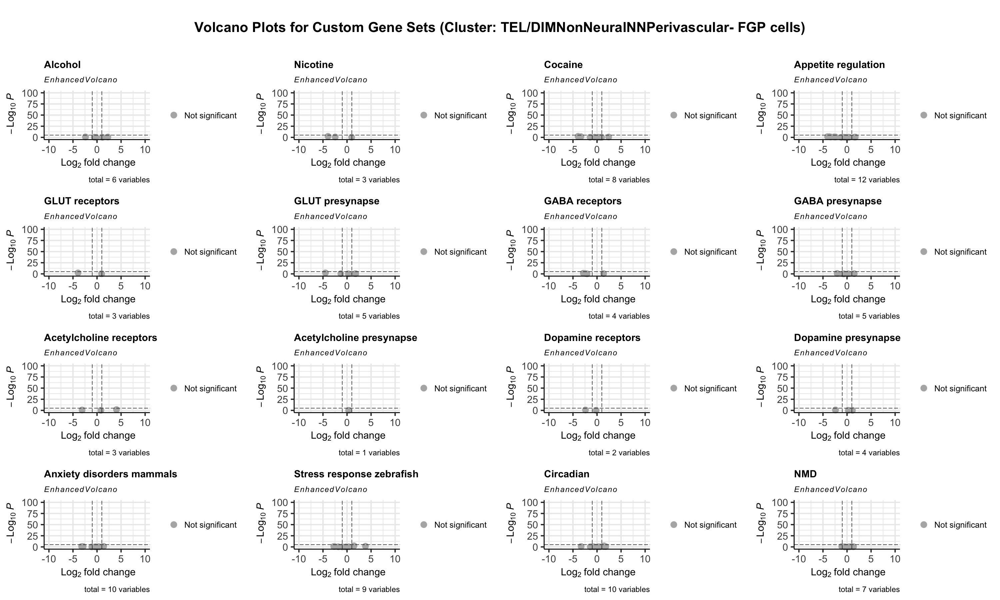

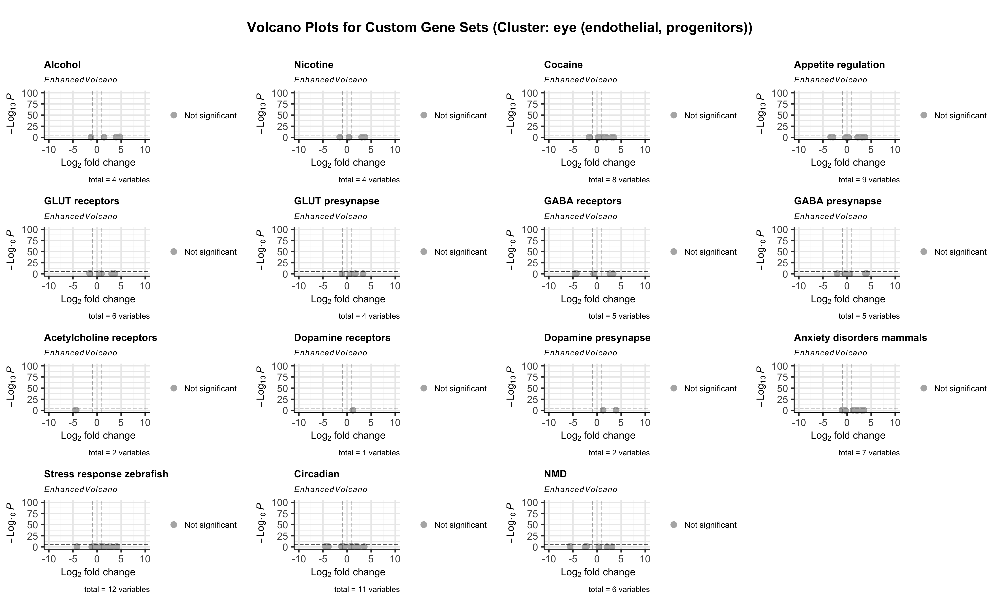

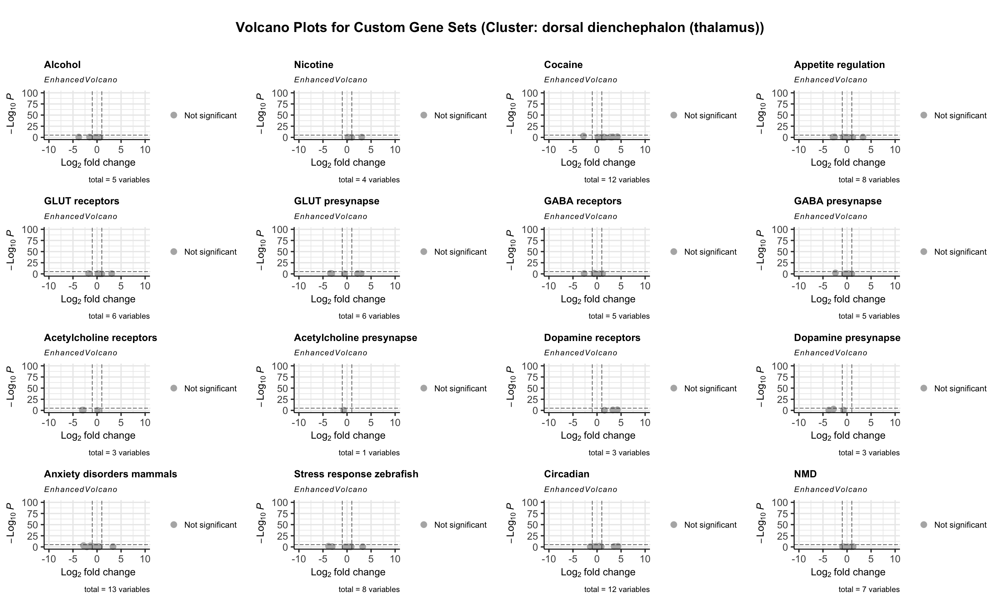

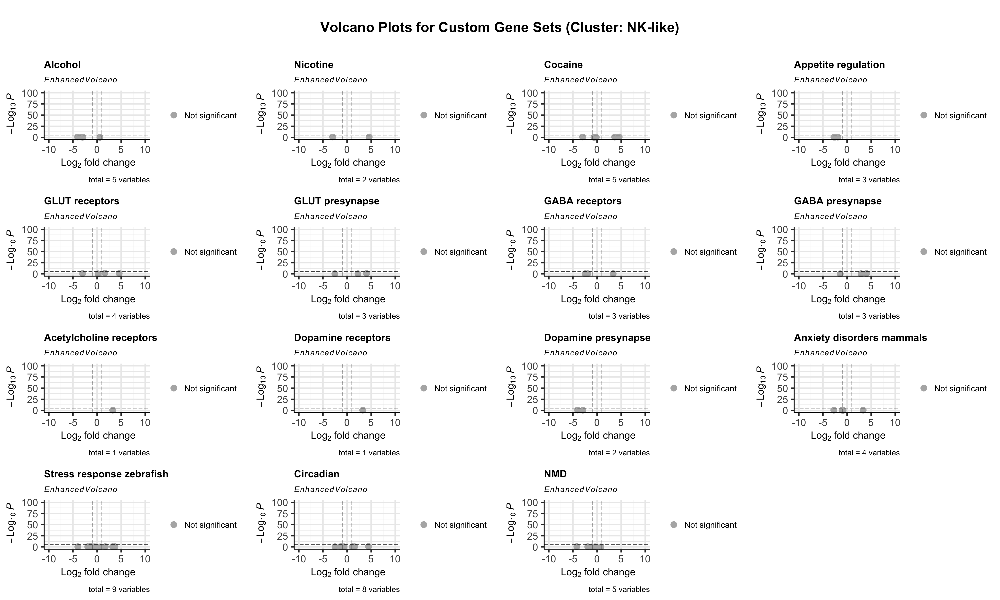

In [78]:
options(repr.plot.height = 15, repr.plot.width = 25)

# Gene-set volcano grids, per cluster
for (cluster in names(all_volcano_plots2)) {
  vp2 = all_volcano_plots2[[cluster]]

  if (length(vp2) == 0) {
    next
  }

  grid.arrange(
    grobs = vp2,
    ncol = 4,
    top = textGrob(
      paste0("\nVolcano Plots for Custom Gene Sets (Cluster: ", cluster, ")\n"),
      gp = gpar(fontsize = 25, fontface = "bold")
    )
  )
}

## Heat map 

For the following code, click on the link in the new output section to get the drop down lists for each cell type.

In [119]:
# define the options for the user dropdown to assign region to the cell type

run_mapping_app <- function(obj){
    # define brain regions
    brain_divisions = c("Prosencephalon (Forebrain)",
                         "Diencephalon (Fore/Midbrain)",
                         "Mesencephalon (Midbrain)",
                         "Rhombencephalon (Hindbrain)",
                         "Other")
    
    # get cell types
    cell_types = obj@meta.data %>% 
                    distinct(sctype_classification) %>% 
                    pull(sctype_classification) %>%
                    sort()
    
  ui <- fluidPage(
      
        titlePanel("Map Regions to Brain Divisions"), # page title 
    
        sidebarLayout(
    
          sidebarPanel( # al the inputs on the left panel
    
            lapply(cell_types, function(cell_type){ # loop over all the cell types
              # create a dropdown menu for each cell type to classify it
              selectInput(
                inputId = paste0("map_", cell_type), # creates a unique id
                label = cell_type,
                choices = brain_divisions,
                selected = "Other" # default value before the user makes selection
              )
    
            }),
    
            actionButton("done", "Done") # creates a button that triggers input$done in shiny
    
          ),
    
          mainPanel(
            h4("Click 'Done' when mapping is complete and close browser")
          )

    )
  )

  server = function(input, output, session){ # server function controls how the app reacts to user input

    observeEvent(input$done, { # runs only when the Done button is clicked

      mapping = data.frame( # creates a dataframe storing the mapping
        Regions = cell_types,
        Map = sapply(cell_types, function(ct){ # loop over cell types
          input[[paste0("map_", ct)]] # retrieves the user selection e.g., input$map_dHabenula
        }),
        stringsAsFactors = FALSE # ensures columns remain character vectors, not factors
      )

      stopApp(mapping) # closes the shiny app and returns mapping to R

    })

  }

  runApp(shinyApp(ui, server)) # creates and runs the shiny app

}

regions_List_map = run_mapping_app(LOG_NORM_NOVOALL_filt_integ_final)

# order forebrain to hindbrain
regions_List_map = regions_List_map %>% mutate(map_number = case_when(
    Map == "Prosencephalon (Forebrain)" ~ 1,
    Map == "Diencephalon (Fore/Midbrain)" ~ 2, 
    Map == "Mesencephalon (Midbrain)" ~ 3,
    Map == "Rhombencephalon (Hindbrain)" ~ 4,
    Map == "Other" ~ 5)) %>%
    arrange(map_number)


Listening on http://127.0.0.1:5000



For the following code, click on the link in the new output section to rename the sctype classifications and group similar clusters manually.

In [137]:
cluster_renaming = function(obj) {
    # get cell types
    cell_types = obj@meta.data %>% 
                    distinct(sctype_classification) %>% 
                    pull(sctype_classification) %>%
                    sort()

    ui_2 <- fluidPage(
      
        titlePanel("Rename cluster names"), # page title 
    
        sidebarLayout(
    
          sidebarPanel( # al the inputs on the left panel
    
            lapply(cell_types, function(cell_type){ # loop over all the cell types
              # create a text box for each cell type for user to type
              textInput(
                inputId = paste0("map_", cell_type), # creates a unique id
                label = cell_type,
                value = cell_type # default value is the original cluster name
              )
    
            }),
    
            actionButton("done", "Done") # creates a button that triggers input$done in shiny
    
          ),
    
          mainPanel(
            h4("Click 'Done' when mapping is complete and close browser")
          )

    )
  )

    server_2 = function(input, output, session){ # server function controls how the app reacts to user input

    observeEvent(input$done, { # runs only when the Done button is clicked

      mapping2 = data.frame( # creates a dataframe storing the mapping
        Regions = cell_types,
        Map = sapply(cell_types, function(ct){ # loop over cell types
          input[[paste0("map_", ct)]] # retrieves the user selection e.g., input$map_dHabenula
        }),
        stringsAsFactors = FALSE # ensures columns remain character vectors, not factors
      )

      stopApp(mapping2) # closes the shiny app and returns mapping to R

    })

  }

    runApp(shinyApp(ui_2, server_2)) # creates and runs the shiny app
    
}

renamed_regions <- cluster_renaming(LOG_NORM_NOVOALL_filt_integ_final)

obj <- LOG_NORM_NOVOALL_filt_integ_final

# create lookup
cluster_map <- renamed_regions %>%
  tibble::deframe()

# apply mapping
obj$manual_regions <- unname(cluster_map[obj$sctype_classification])

# set identity
Idents(obj) <- "manual_regions"

# count cells per manual region
region_cell_counts <- table(obj$manual_regions)

# add per-cell metadata column: each cell gets the count of its manual region
obj$cell_count <- as.numeric(region_cell_counts[as.character(obj$manual_regions)])


Listening on http://127.0.0.1:5000



In [121]:
# load custom_gene_sets_plus_receptors_minus_alc_nic_coc_Jan_26.xlsx (doesnt have alcohol, nicotine and cocaine)
dir_gene_table = readline(prompt = "Please enter the directory to load the gene table: ")
gene_table = read_excel(dir_gene_table)

Please enter the directory to load the gene table:  dotplot and heatmap files/custom_gene_sets_plus_receptors_minus_alc_nic_coc_Jan_26.xlsx


New names:
• `` -> `...2`
• `` -> `...3`
• `` -> `...4`
• `` -> `...5`
• `` -> `...6`
• `` -> `...7`
• `` -> `...8`
• `` -> `...9`
• `` -> `...10`
• `` -> `...11`
• `` -> `...12`
• `` -> `...13`
• `` -> `...14`
• `` -> `...15`
• `` -> `...16`
• `` -> `...17`
• `` -> `...18`
• `` -> `...19`
• `` -> `...20`
• `` -> `...21`
• `` -> `...22`
• `` -> `...23`
• `` -> `...24`
• `` -> `...25`
• `` -> `...26`
• `` -> `...27`
• `` -> `...28`
• `` -> `...29`
• `` -> `...30`
• `` -> `...31`
• `` -> `...32`
• `` -> `...33`
• `` -> `...34`
• `` -> `...35`
• `` -> `...36`
• `` -> `...37`


In [123]:
categories_to_omit = str_split_1(readline(prompt = "Please enter the categories you wish to omit followed by a comma only: "), ",") # e.g., Other,Forebrain
cell_count_threshold = as.numeric(readline(prompt = "Please enter the cell count threshold: "))

Please enter the categories you wish to omit followed by a comma only:  NA
Please enter the cell count threshold:  1


In [145]:
# ======
# FILTER
# ======
regions_List_map = regions_List_map %>%
  filter(!Map %in% categories_to_omit)

obj = subset(obj, subset = cell_count > cell_count_threshold)

# ==========================================
# 2. DATA PREPARATION (MANUAL REGIONS)
# ==========================================
# Use the NEW metadata column
obj$plotting_id <- gsub("-", "_", paste(obj$manual_regions, obj$genotype, sep = "_"))

all_genes_in_table <- unique(na.omit(as.character(unlist(gene_table[, -1]))))
available_genes <- all_genes_in_table[all_genes_in_table %in% rownames(obj)]
available_genotypes = obj@meta.data %>% select(genotype) %>% distinct() %>% pull()

# Recalculate Average Expression based on the new groups
avg_exp <- AverageExpression(obj, features = available_genes, 
                             group.by = "plotting_id", slot = "data")[[1]]
avg_exp_log <- log1p(avg_exp)
colnames(avg_exp_log) <- gsub("-", "_", colnames(avg_exp_log))

# Helper function for LFC
get_diff_matrix_safe <- function(avg_matrix, g1, g2, regions) {
  diff_mat <- matrix(nrow = nrow(avg_matrix), ncol = length(regions), 
                     dimnames = list(rownames(avg_matrix), regions))
  for (reg in regions) {
    # We use gsub to make sure the search string matches the sanitized colnames
    reg_clean <- gsub("-", "_", reg)
    c1 <- paste(reg_clean, g1, sep = "_"); c2 <- paste(reg_clean, g2, sep = "_")
    if (c1 %in% colnames(avg_matrix) & c2 %in% colnames(avg_matrix)) {
      diff_mat[, reg] <- avg_matrix[, c1] - avg_matrix[, c2]
    } else { diff_mat[, reg] <- NA }
  }
  return(diff_mat)
}

# Use manual regions for the diff matrix calculation
regions_all <- sort(as.character(unique(obj$manual_regions)))
base_diff <- get_diff_matrix_safe(avg_exp_log, "C246X", "WT", regions_all)
gene_avg_lfc <- rowMeans(base_diff, na.rm = TRUE)

# NESTED SORTING: Sort genes by Mean_LFC within each Gene Group
gene_map_sorted <- lapply(1:nrow(gene_table), function(i) {
  row_data <- gene_table[i, ]
  set_name <- as.character(row_data[1, 1])
  genes_in_set <- as.character(row_data[1, -1])
  genes_in_set <- genes_in_set[!is.na(genes_in_set) & genes_in_set != ""]
  genes_in_set <- genes_in_set[genes_in_set %in% available_genes]
  if(length(genes_in_set) == 0) return(NULL)
  
  data.frame(Gene = genes_in_set, Group = set_name,
             Mean_LFC = gene_avg_lfc[genes_in_set], stringsAsFactors = FALSE) %>%
    arrange(desc(Mean_LFC))
}) %>% bind_rows()

gene_map_sorted$Group <- factor(gene_map_sorted$Group, levels = unique(gene_table[[1]]))
gene_map_sorted <- gene_map_sorted %>%
  dplyr::mutate(Unique_ID = paste0(Gene, "___", row_number()))

# ==========================================
# 3. REGION ORDERING & MATRIX CONSTRUCTION
# ==========================================
# Pulling regions from the filtered map
ordered_regions_df <- as.character(regions_List_map$Region)
# Final order only includes regions present in the data
final_order <- ordered_regions_df[ordered_regions_df %in% colnames(base_diff)]

build_final_mat <- function(avg_log_mat, map_df, regions, g1, g2) {
  diff_full <- get_diff_matrix_safe(avg_log_mat, g1, g2, regions)
  out_mat <- diff_full[map_df$Gene, , drop = FALSE]
  rownames(out_mat) <- map_df$Unique_ID
  return(out_mat)
}

if ("362del" %in% available_genotypes){
    mat_1 <- build_final_mat(avg_exp_log, gene_map_sorted, final_order, "C246X", "WT")
    mat_2 <- build_final_mat(avg_exp_log, gene_map_sorted, final_order, "362del", "WT")
    mat_3 <- build_final_mat(avg_exp_log, gene_map_sorted, final_order, "C246X", "362del")
} else {
    mat_1 <- build_final_mat(avg_exp_log, gene_map_sorted, final_order, "C246X", "WT")
}


# ==========================================
# 4. AUTOMATED ANNOTATION COLORS
# ==========================================
row_anno <- data.frame(Gene_Set = gene_map_sorted$Group)
rownames(row_anno) <- gene_map_sorted$Unique_ID

col_anno <- data.frame(Region_Map = regions_List_map$Map[match(final_order, regions_List_map$Region)])
rownames(col_anno) <- final_order

n_gene_sets <- length(unique(row_anno$Gene_Set))
gene_set_colors <- colorRampPalette(brewer.pal(min(n_gene_sets, 12), "Spectral"))(n_gene_sets)
names(gene_set_colors) <- levels(row_anno$Gene_Set)

n_region_groups <- length(unique(col_anno$Region_Map))
region_colors <- colorRampPalette(brewer.pal(min(n_region_groups, 8), "Paired"))(n_region_groups)
names(region_colors) <- unique(col_anno$Region_Map)

ann_colors <- list(Gene_Set = gene_set_colors, Region_Map = region_colors)

# ==========================================
# 5. VISUALS & GAPS
# ==========================================
row_gaps <- which(row_anno$Gene_Set[-nrow(row_anno)] != row_anno$Gene_Set[-1])
col_gaps <- which(col_anno$Region_Map[-nrow(col_anno)] != col_anno$Region_Map[-1])

# Calculate scale limits
if ("362del" %in% available_genotypes){
    max_val <- max(abs(range(c(mat_1, mat_2, mat_3), na.rm = TRUE)))
} else {
    max_val <- max(abs(range(c(mat_1), na.rm = TRUE)))
}

my_colors <- colorRampPalette(c("blue", "white", "red"))(100)
my_breaks <- seq(-max_val, max_val, length.out = 101)

plot_params <- list(
  color = my_colors, breaks = my_breaks,
  cluster_cols = FALSE, cluster_rows = FALSE,
  border_color = "white", angle_col = 90,
  fontsize_col = 10, fontsize_row = 7,
  gaps_row = row_gaps, gaps_col = col_gaps,
  annotation_row = row_anno, annotation_col = col_anno,
  annotation_colors = ann_colors,
  labels_row = gene_map_sorted$Gene
)

# ==========================================
# 6. EXECUTE AND SAVE
# ==========================================

if ("362del" %in% available_genotypes){
    p1 <- do.call(pheatmap, c(list(mat_1, main = "LFC: C246X vs WT", silent = TRUE), plot_params))$gtable
    p2 <- do.call(pheatmap, c(list(mat_2, main = "LFC: 362del vs WT", silent = TRUE), plot_params))$gtable
    p3 <- do.call(pheatmap, c(list(mat_3, main = "LFC: C246X vs 362del", silent = TRUE), plot_params))$gtable
} else {
    p1 <- do.call(pheatmap, c(list(mat_1, main = "LFC: C246X vs WT", silent = TRUE), plot_params))$gtable
}

file_name1 = readline(prompt = "Please enter full directory to save the heatmap (including .pdf extension): ")

# open pdf
pdf(file_name1, width = 25, height = 22)

if ("362del" %in% available_genotypes){
    grid.arrange(p1, p2, p3, ncol = 3)
} else {
    grid.draw(p1)
}

# close pdf
dev.off()


Warning message in brewer.pal(min(n_gene_sets, 12), "Spectral"):
“n too large, allowed maximum for palette Spectral is 11
Returning the palette you asked for with that many colors
”
Warning message in brewer.pal(min(n_region_groups, 8), "Paired"):
“minimal value for n is 3, returning requested palette with 3 different levels
”


agg_record_312928385 
                   2

Please enter full directory to save the heatmap (including .pdf extension):  /Users/sadsa/Library/CloudStorage/OneDrive-NationalUniversityofSingapore/NUS/ScRNA/src/dotplot and heatmap files/Zebrafish_Genotype_Manual_Filtered2.pdf


## Dot Plot
The purpose of this section is to determine the top 3 marker genes based on average cluster expression for each cluster in this data and seeing if this matches literature. Plot 1 is based on based on the differential analysis conducted on this data and plot 2 cross references plot 1's output with the literature. 

In [148]:
# ==========================================
# 1. SETUP 
# ==========================================

# ensure Ident is correct
Idents(LOG_NORM_NOVOALL_filt_integ_final) = "sctype_classification"

# Case matching of genes i.e., making every upper case
valid_features <- rownames(LOG_NORM_NOVOALL_filt_integ_final)
case_match_df <- data.frame(
  upper = toupper(valid_features),
  original = valid_features,
  stringsAsFactors = FALSE
)

# ==========================================
# 1b. Region Order and Automated Colors 
# ==========================================

# 1. Apply cleaning to the ENTIRE map dataframe first
regions_List_map$Regions <- clean_strings(regions_List_map$Regions)
regions_List_map$Map <- clean_strings(regions_List_map$Map)

# 2. Re-extract and clean your regions_order
regions_order_raw <- as.character(regions_List_map$Regions)
regions_order <- clean_strings(regions_order_raw)

# 3. Clean Seurat metadata
LOG_NORM_NOVOALL_filt_integ_final$sctype_classification <- clean_strings(LOG_NORM_NOVOALL_filt_integ_final$sctype_classification)

# 4. Filter list (now match will work perfectly)
regions_order <- regions_order[regions_order %in% unique(LOG_NORM_NOVOALL_filt_integ_final$sctype_classification)]

# 5. Map groups (This will now have NO NAs)
region_groups <- regions_List_map$Map[match(regions_order, regions_List_map$Regions)]
unique_groups <- unique(region_groups)

# 6. Generate Palette
group_palette <- colorRampPalette(brewer.pal(min(length(unique_groups), 8), "Paired"))(length(unique_groups))
names(group_palette) <- unique_groups

# 7. Create final color vector with a "fallback" color just in case
final_region_colors <- group_palette[region_groups]
final_region_colors[is.na(final_region_colors)] <- "black" # Safety net
names(final_region_colors) <- regions_order

# ==========================================
# 2. MARKER DATA (ROC)
# ==========================================
if(!exists("all_actual_markers")){
  all_actual_markers <- FindAllMarkers(
    LOG_NORM_NOVOALL_filt_integ_final, 
    only.pos = TRUE, 
    test.use = "roc", 
    min.pct = 0.25, 
    logfc.threshold = 0.25, 
    verbose = FALSE
  )
}

# Standardize names and handle Zebrafish paralogs (many-to-many)
all_actual_markers_fixed <- all_actual_markers %>%
  mutate(cluster = clean_strings(as.character(cluster))) %>% # standardise the cluster names to match the clean sctype_classification col
  mutate(gene_upper = toupper(gene)) %>%
  inner_join(case_match_df, by = c("gene_upper" = "upper"), relationship = "many-to-many") %>%
  select(-gene, -gene_upper) %>%
  rename(gene = original) %>%
  distinct()

# ==========================================
# 3. PLOT 1: DISCOVERY MARKERS
# ==========================================
top_discovery_markers <- all_actual_markers_fixed %>%
  filter(cluster %in% regions_order) %>%
  group_by(cluster) %>%
  slice_max(order_by = myAUC, n = 3, with_ties = FALSE) %>% # take the top 3
  ungroup() %>%
  mutate(cluster = factor(cluster, levels = regions_order)) %>%
  arrange(cluster)

genes_discovery <- unique(top_discovery_markers$gene)

p1_dot <- DotPlot(LOG_NORM_NOVOALL_filt_integ_final, features = genes_discovery, dot.scale = 6) +
  scale_y_discrete(limits = regions_order) +
  scale_colour_gradient2(low = "blue", mid = "lightgrey", high = "red", midpoint = 0) +
  theme_bw() +
  theme(
    axis.text.x = element_text(angle = 90, vjust = 0.5, hjust = 1, size = 8),
    # Colored text using standard element_text (avoids ggtext/xfun)
    axis.text.y = element_text(color = final_region_colors[regions_order], face = "bold"),
    panel.grid.major = element_line(color = "grey95")
  ) +
  labs(title = "Top Discovery Markers", x = "Genes", y = "Brain Region")

# ==========================================
# 4. PLOT 2: CURATED MARKERS (gs_list)
# ==========================================

# 4a. create a cleaned copy of gs_list and extract markers
# we apply clean_strings to the names of the list to match regions_order
gs_list_cleaned = gs_list
names(gs_list_cleaned$gs_positive) = clean_strings(names(gs_list$gs_positive))

# Robust extraction using standard data.frame tools
curated_map_list <- list()
for(reg in names(gs_list_cleaned$gs_positive)){
  genes <- gs_list_cleaned$gs_positive[[reg]]
  if(length(genes) > 0 && reg %in% regions_order){
    curated_map_list[[reg]] <- data.frame(
      gene_upper = toupper(as.character(genes)),
      cluster = reg,
      stringsAsFactors = FALSE
    )
  }
}
curated_map <- do.call(rbind, curated_map_list) # avoids dplyr 'bind_rows' which can be version-sensitive

# 4b. Match to Seurat names
curated_map_fixed <- curated_map %>%
  inner_join(case_match_df, by = c("gene_upper" = "upper"), relationship = "many-to-many") %>%
  select(gene = original, cluster) %>%
  distinct()

top_curated_diagonal <- all_actual_markers_fixed %>%
  inner_join(curated_map_fixed, by = c("gene", "cluster")) %>%
  group_by(cluster) %>%
  slice_max(order_by = myAUC, n = 3, with_ties = FALSE) %>%
  ungroup() %>%
  mutate(cluster = factor(cluster, levels = regions_order)) %>%
  arrange(cluster)

genes_curated <- unique(top_curated_diagonal$gene)

# 4c. Generate Curated DotPlot
p2_dot <- DotPlot(LOG_NORM_NOVOALL_filt_integ_final, features = genes_curated, dot.scale = 7) +
  facet_grid(~factor(top_curated_diagonal$cluster[match(features.plot, top_curated_diagonal$gene)], 
                     levels = regions_order), 
             scales = "free_x", space = "free_x") +
  scale_y_discrete(limits = regions_order) +
  scale_colour_gradient2(low = "blue", mid = "lightgrey", high = "red", midpoint = 0) +
  theme_bw() +
  theme(
    axis.text.x = element_text(angle = 90, vjust = 0.5, hjust = 1, size = 8),
    axis.text.y = element_text(color = final_region_colors[regions_order], size = 9, face = "bold"),
    strip.background = element_rect(fill = "white"),
    strip.text = element_text(face = "bold", size = 7, angle = 90),
    panel.spacing = unit(0.1, "lines"),
    panel.grid.major = element_blank()
  ) +
  labs(title = "Validated Curated Markers", x = "Curated Genes", y = "Brain Region")


# ==========================================
# 5. EXPORT 
# ==========================================

file_name2 = readline(prompt = "Please enter full directory to save the dotplot (including .pdf extension): ")

# open pdf
pdf(file_name2, width = 18, height = 12)

grid.draw(p1_dot)
grid.draw(p2_dot)

# close pdf
dev.off()

Warning message in brewer.pal(min(length(unique_groups), 8), "Paired"):
“minimal value for n is 3, returning requested palette with 3 different levels
”
Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.
Warning message:
“Vectorized input to `element_text()` is not officially supported.
ℹ Results may be unexpected or may change in future versions of ggplot2.”
Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.
Warning message:
“Vectorized input to `element_text()` is not officially supported.
ℹ Results may be unexpected or may change in future versions of ggplot2.”


agg_record_884616499 
                   2

Please enter full directory to save the dotplot (including .pdf extension):  /Users/sadsa/Library/CloudStorage/OneDrive-NationalUniversityofSingapore/NUS/ScRNA/src/dotplot and heatmap files/Zebrafish_DotPlots_Direct_Export2.pdf
